In [1]:
#automatically reload stuff
%reload_ext autoreload
%autoreload 2
from SymptomPreprocessing import *
from SpatialPreprocessing import *
import Preprocessing as P
import Cluster
import Metrics
import re
import Utils
from warnings import simplefilter 
from sklearn.decomposition import PCA
from scipy.stats import power_divergence, chisquare, chi2_contingency, pointbiserialr, pearsonr, fisher_exact

import statsmodels.api as sm

import RPorts 

import matplotlib.patches as mpatches
import matplotlib.path as mpath
import matplotlib.transforms as mplt
import matplotlib as mpl

from sklearn.manifold import TSNE, Isomap
from sklearn.decomposition import PCA
from scipy.spatial import ConvexHull

simplefilter(action='ignore')
pd.set_option('display.max_rows', 1000)

In [77]:
rds = RadDataset()
rds.get_value_array(rds.dvh_df.columns,as_df=True)

spellchecking...
renaming things
filtering pateints
adding nan values for missing organs
adding histograms


,Esophagus_V50,Esophagus_V20,Esophagus_D40,Esophagus_max_dose,Esophagus_D99,Esophagus_V45,Esophagus_V65,Esophagus_D95,Esophagus_D30,Esophagus_V55,...,Glottic_Area_V75,Glottic_Area_D25,Glottic_Area_D45,Glottic_Area_D50,Glottic_Area_D5,Glottic_Area_D65,Glottic_Area_V10,Glottic_Area_V25,Glottic_Area_V30,Glottic_Area_D20
id,,,,,,,,,,,,,,,,,,,,,
2.0,14.367188,85.687500,39.781250,58.27,3.500000,23.890625,0.0,6.160156,42.531250,1.211914,...,0.0,30.906250,23.953125,22.437500,44.968750,19.515625,100.000000,40.843750,27.234375,33.125000
6.0,0.177246,72.562500,39.093750,50.88,1.870117,9.570312,0.0,2.529297,40.375000,0.000000,...,0.0,34.656250,32.593750,32.312500,43.125000,31.375000,100.000000,100.000000,83.000000,36.406250
7.0,0.000000,61.500000,31.609375,43.62,0.010002,0.000000,0.0,2.570312,33.125000,0.000000,...,0.0,29.906250,29.062500,28.906250,30.968750,28.625000,100.000000,100.000000,22.828125,30.046875
8.0,0.000000,49.187500,27.187500,34.01,3.830078,0.000000,0.0,5.300781,29.937500,0.000000,...,0.0,15.312500,14.000000,13.812500,27.984375,10.390625,67.687500,19.156250,0.000000,19.203125
9.0,12.492188,86.187500,37.000000,59.75,12.820312,22.078125,0.0,15.859375,41.281250,4.335938,...,0.0,21.531250,15.671875,13.179688,29.468750,6.281250,50.843750,15.109375,4.316406,23.031250
10.0,0.477051,64.687500,35.562500,51.81,3.419922,7.031250,0.0,4.238281,38.906250,0.000000,...,0.0,53.656250,42.343750,40.843750,65.875000,37.781250,100.000000,99.500000,88.875000,55.375000
11.0,0.000000,29.250000,11.093750,29.00,6.058594,0.000000,0.0,6.230469,19.750000,0.000000,...,0.0,18.234375,12.609375,11.851562,20.515625,10.820312,79.187500,4.761719,4.761719,18.406250
12.0,0.000000,0.000000,1.599609,6.10,0.010002,0.000000,0.0,0.020004,1.940430,0.000000,...,0.0,12.781250,6.101562,2.750000,28.093750,2.039062,31.890625,7.914062,3.755859,15.210938
13.0,0.000000,78.375000,39.906250,43.43,0.010002,0.000000,0.0,2.800781,40.656250,0.000000,...,0.0,15.046875,10.796875,10.570312,23.343750,9.367188,56.156250,4.503906,0.000000,15.820312


In [78]:
rds.dvh_df

,ROI,id,Structure,volume,mean_dose,min_dose,max_dose,V5,V10,V15,...,D65,D70,D75,D80,D85,D90,D95,D97,D98,D99
0,Esophagus,2.0,Esophagus_U,14279.479980,35.720554,2.97,58.27,96.37500,91.5625,88.250000,...,34.000000,33.031250,31.812500,29.187500,21.343750,13.140625,6.160156,4.710938,4.011719,3.500000
1,Spinal_Cord,2.0,SpinalCord_Cerv,12866.363525,23.816881,17.68,30.08,100.00000,100.0000,100.000000,...,23.015625,22.687500,22.359375,21.984375,21.531250,20.906250,19.453125,18.781250,18.453125,18.062500
2,Rt_Brachial_Plexus,2.0,Brachial_Plex_L,7139.739990,36.247807,3.41,62.72,95.68750,80.0000,75.500000,...,35.468750,25.656250,16.375000,9.968750,7.468750,6.308594,5.230469,4.621094,4.199219,3.960938
3,Lt_Brachial_Plexus,2.0,Brachial_Plex_R,5500.030518,42.946247,13.08,60.34,100.00000,100.0000,99.000000,...,40.750000,39.125000,37.125000,34.812500,32.312500,29.734375,26.031250,22.312500,20.515625,14.953125
4,Cricopharyngeal_Muscle,2.0,Cricopharyngeus,2698.516846,49.904351,40.70,57.47,100.00000,100.0000,100.000000,...,49.218750,48.812500,48.187500,47.781250,46.687500,45.000000,43.031250,42.593750,41.906250,41.187500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,Mandible,822.0,Mandible,67071.914673,17.989012,25.00,73.48,37.09375,35.5625,34.562500,...,1.120117,1.030273,0.939941,0.859863,0.779785,0.689941,0.540039,0.459961,0.409912,0.360107
36,Hard_Palate,822.0,Hardpalate,2670.288086,8.747536,2.80,25.01,74.43750,31.5000,12.710938,...,5.859375,5.378906,4.941406,4.511719,4.121094,3.740234,3.359375,3.189453,3.099609,3.000000
37,Lower_Lip,822.0,Lips_Lower,1903.533936,0.933136,62.00,1.81,0.00000,0.0000,0.000000,...,0.759766,0.740234,0.729980,0.709961,0.700195,0.689941,0.680176,0.669922,0.660156,0.649902
38,Upper_Lip,822.0,Lips_Upper,3667.831421,1.333635,57.00,4.48,0.00000,0.0000,0.000000,...,1.070312,0.970215,0.859863,0.779785,0.709961,0.669922,0.629883,0.609863,0.600098,0.589844


In [81]:
sd_df = P.get_merged_symp_dose_df(rds,roll_up=True)
sd_df.T

id,7,8,9,10,11,13,15,16,18,22,...,792,794,797,800,803,807,809,811,813,816
D10,"[37.625, 37.15625, 66.3125, 60.3125, 49.4375, ...","[32.15625, 32.0625, 65.375, 56.6875, 22.5, 31....","[51.4375, 27.515625, 51.4375, 51.4375, 18.6875...","[44.21875, 35.625, 55.9375, 64.75, 52.84375, 5...","[26.15625, 31.984375, 57.125, 45.40625, 29.265...","[42.21875, 29.625, 48.6875, 60.46875, 19.5, 41...","[44.90625, 33.28125, 57.71875, 47.75, 43.625, ...","[24.9375, 32.28125, 56.84375, 52.625, 39.09375...","[51.4375, 29.78125, 51.4375, 51.4375, 30.5625,...","[45.4375, 35.125, 64.8125, 71.375, 62.78125, 6...",...,"[15.09375, 16.125, 44.5625, 15.6015625, 20.578...","[30.34375, 26.515625, 52.15625, 47.53125, 40.8...","[28.28125, 30.0625, 56.84375, 58.3125, 55.6875...","[13.7421875, 18.546875, 34.875, 28.5625, 21.56...","[51.4375, 10.3125, 14.53125, 2.6796875, 1.8603...","[35.0625, 38.71875, 55.03125, 57.15625, 38.5, ...","[1.580078125, 6.76171875, 17.4375, 2.419921875...","[51.4375, 24.453125, 51.4375, 51.4375, 26.0312...","[51.4375, 0.0200042724609375, 51.4375, 51.4375...","[7.55859375, 10.3125, 17.15625, 24.59375, 20.6..."
D15,"[36.5625, 36.75, 64.0625, 59.96875, 48.375, 49...","[31.703125, 31.109375, 63.34375, 55.75, 21.312...","[48.59375, 26.671875, 48.59375, 48.59375, 15.0...","[43.1875, 34.28125, 54.3125, 62.6875, 50.78125...","[25.625, 31.359375, 56.875, 45.15625, 26.48437...","[41.8125, 29.046875, 48.15625, 58.34375, 14.52...","[44.0, 32.75, 57.21875, 47.5625, 40.40625, 48....","[24.0, 31.453125, 56.125, 51.9375, 34.15625, 4...","[48.59375, 28.984375, 48.59375, 48.59375, 29.2...","[44.34375, 34.03125, 63.78125, 70.8125, 59.312...",...,"[13.5625, 15.4765625, 43.25, 14.390625, 20.234...","[29.703125, 26.078125, 49.625, 45.4375, 39.937...","[26.75, 29.4375, 53.96875, 54.875, 54.34375, 4...","[13.1875, 17.765625, 34.34375, 27.0625, 21.218...","[48.59375, 10.046875, 14.1875, 1.9296875, 1.75...","[34.53125, 38.28125, 54.46875, 55.5, 37.0625, ...","[1.1796875, 6.51171875, 16.65625, 2.23046875, ...","[48.59375, 23.265625, 48.59375, 48.59375, 23.6...","[48.59375, 0.0200042724609375, 48.59375, 48.59...","[5.51171875, 9.8203125, 13.7578125, 22.015625,..."
D2,"[39.96875, 38.0625, 71.8125, 60.90625, 52.1562...","[33.4375, 34.09375, 68.75, 58.28125, 33.6875, ...","[56.65625, 29.5625, 56.65625, 56.65625, 27.312...","[47.84375, 39.21875, 58.15625, 68.5625, 57.406...","[27.5625, 33.25, 57.65625, 45.84375, 36.75, 44...","[43.0, 31.0, 54.09375, 70.625, 35.5625, 51.0, ...","[46.5, 34.9375, 58.71875, 48.375, 46.875, 51.9...","[28.5, 34.84375, 58.4375, 53.65625, 48.3125, 5...","[56.65625, 31.953125, 56.65625, 56.65625, 34.5...","[48.875, 38.09375, 69.25, 72.25, 67.625, 66.62...",...,"[17.375, 19.390625, 46.1875, 16.84375, 21.2187...","[32.09375, 27.90625, 55.53125, 52.53125, 43.96...","[34.3125, 31.390625, 64.0625, 64.25, 59.09375,...","[14.4921875, 20.734375, 36.125, 30.59375, 23.5...","[56.65625, 11.0078125, 16.4375, 4.33984375, 2....","[38.125, 39.65625, 56.21875, 58.28125, 43.4062...","[2.6796875, 7.2890625, 18.40625, 3.48046875, 5...","[56.65625, 27.078125, 56.65625, 56.65625, 33.5...","[56.65625, 0.0200042724609375, 56.65625, 56.65...","[12.3203125, 11.328125, 28.546875, 33.75, 25.0..."
D20,"[35.25, 36.34375, 62.71875, 59.71875, 47.34375...","[31.203125, 30.25, 61.34375, 54.5625, 17.84375...","[46.03125, 25.9375, 46.03125, 46.03125, 13.0, ...","[42.0, 33.125, 52.84375, 59.53125, 48.875, 46....","[25.09375, 30.71875, 56.65625, 45.0, 22.828125...","[41.40625, 28.46875, 47.8125, 56.4375, 12.9921...","[43.0625, 32.28125, 56.625, 47.375, 37.15625, ...","[22.6875, 30.375, 55.5, 51.375, 30.84375, 43.6...","[46.03125, 28.3125, 46.03125, 46.03125, 28.265...","[43.5, 33.25, 62.8125, 68.6875, 56.28125, 60.9...",...,"[12.5703125, 15.0, 41.96875, 12.2734375, 19.95...","[29.015625, 25.71875, 48.03125, 44.09375, 39.1...","[25.609375, 28.78125, 51.9375, 52.40625, 53.21...","[12.4921875, 17.0625, 34.0, 25.65625, 20.85937...","[46.03125, 9.71875, 13.84375, 1.580078125, 1.6

In [82]:
sd_df[['t_severe','n_severe']].mean()

t_severe    0.220630
n_severe    0.590258
dtype: float64

In [83]:
sd_df.reset_index().fillna(0).to_csv(Const.data_dir + 'dose_symptoms_merged.csv',index=False)
pd.read_csv(Const.data_dir + 'dose_symptoms_merged.csv')

,id,D10,D15,D2,D20,D25,D30,D35,D40,D45,...,symptoms_work,symptomgroup_core,symptomgroup_interference,symptomgroup_hnc,severe_6wk_symptoms,severe_late_symptoms,moderate_6wk_symptoms,moderate_late_symptoms,mild_6wk_symptoms,mild_late_symptoms
0,7,"[37.625, 37.15625, 66.3125, 60.3125, 49.4375, ...","[36.5625, 36.75, 64.0625, 59.96875, 48.375, 49...","[39.96875, 38.0625, 71.8125, 60.90625, 52.1562...","[35.25, 36.34375, 62.71875, 59.71875, 47.34375...","[34.0625, 35.90625, 61.53125, 59.40625, 46.562...","[33.125, 35.5, 60.34375, 59.1875, 45.6875, 43....","[32.28125, 35.03125, 59.03125, 58.90625, 44.75...","[31.609375, 34.625, 57.71875, 58.625, 43.96875...","[30.84375, 34.1875, 56.40625, 58.3125, 43.1875...",...,"[0.0, 0.0, 0.0, 1.0, 2.0, 1.0, 2.0, 1.0, 2.0, ...",[0.61538462 1.30769231 1.53846154 2.69230769 2...,[0. 0.66666667 0.83333333 2. 1...,[0.77777778 0.77777778 0.77777778 2.11111111 3...,False,False,False,False,False,False
1,8,"[32.15625, 32.0625, 65.375, 56.6875, 22.5, 31....","[31.703125, 31.109375, 63.34375, 55.75, 21.312...","[33.4375, 34.09375, 68.75, 58.28125, 33.6875, ...","[31.203125, 30.25, 61.34375, 54.5625, 17.84375...","[30.609375, 29.40625, 60.03125, 52.375, 14.367...","[29.9375, 28.390625, 59.5, 50.5625, 13.140625,...","[28.96875, 27.453125, 58.96875, 49.46875, 11.7...","[27.1875, 26.46875, 58.53125, 48.59375, 11.203...","[24.875, 25.453125, 58.125, 48.0, 10.9609375, ...",...,"[1.0, 1.0, 2.0, 0.0, 1.0, 1.0, 1.0, 3.0, 3.0, ...",[1.46153846 2. 1.46153846 1.46153846 1...,[0.5 1.16666667 1.33333333 0.66666667 1...,[0.55555556 1.66666667 0.66666667 1.11111111 1...,False,False,False,False,False,False
2,9,"[51.4375, 27.515625, 51.4375, 51.4375, 18.6875...","[48.59375, 26.671875, 48.59375, 48.59375, 15.0...","[56.65625, 29.5625, 56.65625, 56.65625, 27.312...","[46.03125, 25.9375, 46.03125, 46.03125, 13.0, ...","[43.53125, 25.296875, 43.53125, 43.53125, 11.3...","[41.28125, 24.671875, 41.28125, 41.28125, 10.3...","[39.15625, 24.046875, 39.15625, 39.15625, 9.82...","[37.0, 23.359375, 37.0, 37.0, 9.4609375, 11.28...","[35.125, 22.625, 35.125, 35.125, 9.109375, 9.3...",...,"[0.0, 0.0, 0.0, 0.0, 3.0, 3.0, 3.0, 2.0, 1.0, ...",[0. 0.15384615 0.30769231 0.84615385 1...,[0. 0.16666667 0.16666667 0.16666667 1...,[0. 1. 1. 1.77777778 2...,False,False,False,False,False,False
3,10,"[44.21875, 35.625, 55.9375, 64.75, 52.84375, 5...","[43.1875, 34.28125, 54.3125, 62.6875, 50.78125...","[47.84375, 39.21875, 58.15625, 68.5625, 57.406...","[42.0, 33.125, 52.84375, 59.53125, 48.875, 46....","[40.71875, 32.34375, 51.4375, 58.65625, 47.343...","[38.90625, 31.625, 50.0, 58.3125, 46.5, 44.687...","[36.875, 30.921875, 48.75, 57.8125, 46.125, 43...","[35.5625, 30.1875, 47.6875, 56.6875, 45.75, 43...","[33.96875, 29.4375, 46.4375, 55.03125, 45.3125...",...,"[0.0, 0.0, 1.0, 2.0, 1.0, 2.0, 4.0, 4.0, 0.0, ...",[1. 1.07692308 0.84615385 1.61538462 2...,[0.16666667 0.66666667 1. 2. 1...,[0.33333333 0.66666667 0.33333333 1.66666667 3...,False,False,False,False,False,False
4,11,"[26.15625, 31.984375, 57.125, 45.40625, 29.265...","[25.625, 31.359375, 56.875, 45.15625, 26.48437...","[27.5625, 33.25, 57.65625, 45.84375, 36.75, 44...","[25.09375, 30.71875, 56.65625, 45.0, 22.828125...","[22.625, 30.15625, 56.46875, 44.8125, 19.85937...","[19.75, 29.65625, 56.21875, 44.625, 17.640625,...","[14.1484375, 29.234375, 55.9375, 44.46875, 15....","[11.09375, 28.84375, 55.6875, 44.21875, 14.210...","[9.1015625, 28.46875, 55.4375, 44.03125, 12.53...",...,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[0. 0.15384615 0.46153846 1.46153846 1...,[0. 0. 0. 1.33333333 0...,[0. 0. 0.22222222 1.77777778 2...,False,False,False,False,False,False
5,13,"[42.21875, 29.625, 48.6875, 60.46875, 19.5, 41...","[41.8125, 29.046875, 48.15625, 58.34375, 14.52...","[43.0, 31.0, 54.09375, 70.625, 35.5625, 51.0, ...","[41.40625, 28.46875, 47.8125, 56.4375, 12.9921...","[41.03125, 27.859375, 47.59375, 54.5, 10.29687...","[40.65625, 27.234375, 47.375, 52.78125, 9.3593...","[40.3125, 26

In [14]:
sd_df['D35'].dtype

dtype('O')

In [144]:
def add_sd_clusters(sddf):
    df = P.add_sd_symptom_clusters(sddf)
    df = P.add_sd_dose_clusters(df)
    return df

sd_df = add_sd_clusters(sd_df)
sd_df.to_pickle(Const.data_dir + 'clustered_dose_symptoms_merged_csv.pickle')
sd_df.T

using default similarity


id,7,8,9,10,11,13,15,16,18,22,...,792,794,797,800,803,807,809,811,813,816
D10,"[37.625, 37.15625, 60.3125, 66.3125, 49.4375, ...","[32.15625, 32.0625, 56.6875, 65.375, 22.5, 31....","[51.4375, 27.515625, 51.4375, 51.4375, 18.6875...","[44.21875, 35.625, 64.75, 55.9375, 52.84375, 5...","[26.15625, 31.984375, 45.40625, 57.125, 29.265...","[42.21875, 29.625, 60.46875, 48.6875, 19.5, 41...","[44.90625, 33.28125, 47.75, 57.71875, 43.625, ...","[24.9375, 32.28125, 52.625, 56.84375, 39.09375...","[51.4375, 29.78125, 51.4375, 51.4375, 30.5625,...","[45.4375, 35.125, 71.375, 64.8125, 62.78125, 6...",...,"[15.09375, 16.125, 15.6015625, 44.5625, 20.578...","[30.34375, 26.515625, 47.53125, 52.15625, 40.8...","[28.28125, 30.0625, 58.3125, 56.84375, 55.6875...","[13.7421875, 18.546875, 28.5625, 34.875, 21.56...","[51.4375, 10.3125, 2.6796875, 14.53125, 1.8603...","[35.0625, 38.71875, 57.15625, 55.03125, 38.5, ...","[1.580078125, 6.76171875, 2.419921875, 17.4375...","[51.4375, 24.453125, 51.4375, 51.4375, 26.0312...","[51.4375, 0.0200042724609375, 51.4375, 51.4375...","[7.55859375, 10.3125, 24.59375, 17.15625, 20.6..."
D15,"[36.5625, 36.75, 59.96875, 64.0625, 48.375, 49...","[31.703125, 31.109375, 55.75, 63.34375, 21.312...","[48.59375, 26.671875, 48.59375, 48.59375, 15.0...","[43.1875, 34.28125, 62.6875, 54.3125, 50.78125...","[25.625, 31.359375, 45.15625, 56.875, 26.48437...","[41.8125, 29.046875, 58.34375, 48.15625, 14.52...","[44.0, 32.75, 47.5625, 57.21875, 40.40625, 48....","[24.0, 31.453125, 51.9375, 56.125, 34.15625, 4...","[48.59375, 28.984375, 48.59375, 48.59375, 29.2...","[44.34375, 34.03125, 70.8125, 63.78125, 59.312...",...,"[13.5625, 15.4765625, 14.390625, 43.25, 20.234...","[29.703125, 26.078125, 45.4375, 49.625, 39.937...","[26.75, 29.4375, 54.875, 53.96875, 54.34375, 4...","[13.1875, 17.765625, 27.0625, 34.34375, 21.218...","[48.59375, 10.046875, 1.9296875, 14.1875, 1.75...","[34.53125, 38.28125, 55.5, 54.46875, 37.0625, ...","[1.1796875, 6.51171875, 2.23046875, 16.65625, ...","[48.59375, 23.265625, 48.59375, 48.59375, 23.6...","[48.59375, 0.0200042724609375, 48.59375, 48.59...","[5.51171875, 9.8203125, 22.015625, 13.7578125,..."
D2,"[39.96875, 38.0625, 60.90625, 71.8125, 52.1562...","[33.4375, 34.09375, 58.28125, 68.75, 33.6875, ...","[56.65625, 29.5625, 56.65625, 56.65625, 27.312...","[47.84375, 39.21875, 68.5625, 58.15625, 57.406...","[27.5625, 33.25, 45.84375, 57.65625, 36.75, 44...","[43.0, 31.0, 70.625, 54.09375, 35.5625, 51.0, ...","[46.5, 34.9375, 48.375, 58.71875, 46.875, 51.9...","[28.5, 34.84375, 53.65625, 58.4375, 48.3125, 5...","[56.65625, 31.953125, 56.65625, 56.65625, 34.5...","[48.875, 38.09375, 72.25, 69.25, 67.625, 66.62...",...,"[17.375, 19.390625, 16.84375, 46.1875, 21.2187...","[32.09375, 27.90625, 52.53125, 55.53125, 43.96...","[34.3125, 31.390625, 64.25, 64.0625, 59.09375,...","[14.4921875, 20.734375, 30.59375, 36.125, 23.5...","[56.65625, 11.0078125, 4.33984375, 16.4375, 2....","[38.125, 39.65625, 58.28125, 56.21875, 43.4062...","[2.6796875, 7.2890625, 3.48046875, 18.40625, 5...","[56.65625, 27.078125, 56.65625, 56.65625, 33.5...","[56.65625, 0.0200042724609375, 56.65625, 56.65...","[12.3203125, 11.328125, 33.75, 28.546875, 25.0..."
D20,"[35.25, 36.34375, 59.71875, 62.71875, 47.34375...","[31.203125, 30.25, 54.5625, 61.34375, 17.84375...","[46.03125, 25.9375, 46.03125, 46.03125, 13.0, ...","[42.0, 33.125, 59.53125, 52.84375, 48.875, 46....","[25.09375, 30.71875, 45.0, 56.65625, 22.828125...","[41.40625, 28.46875, 56.4375, 47.8125, 12.9921...","[43.0625, 32.28125, 47.375, 56.625, 37.15625, ...","[22.6875, 30.375, 51.375, 55.5, 30.84375, 43.6...","[46.03125, 28.3125, 46.03125, 46.03125, 28.265...","[43.5, 33.25, 68.6875, 62.8125, 56.28125, 60.9...",...,"[12.5703125, 15.0, 12.2734375, 41.96875, 19.95...","[29.015625, 25.71875, 44.09375, 48.03125, 39.1...","[25.609375, 28.78125, 52.40625, 51.9375, 53.21...","[12.4921875, 17.0625, 25.65625, 34.0, 20.85937...","[46.03125, 9.71875, 1.580078125, 13.84375, 1.6

In [145]:
sd_df = pd.read_pickle(Const.data_dir + 'clustered_dose_symptoms_merged_csv.pickle')
sd_df.T

id,7,8,9,10,11,13,15,16,18,22,...,792,794,797,800,803,807,809,811,813,816
D10,"[37.625, 37.15625, 60.3125, 66.3125, 49.4375, ...","[32.15625, 32.0625, 56.6875, 65.375, 22.5, 31....","[51.4375, 27.515625, 51.4375, 51.4375, 18.6875...","[44.21875, 35.625, 64.75, 55.9375, 52.84375, 5...","[26.15625, 31.984375, 45.40625, 57.125, 29.265...","[42.21875, 29.625, 60.46875, 48.6875, 19.5, 41...","[44.90625, 33.28125, 47.75, 57.71875, 43.625, ...","[24.9375, 32.28125, 52.625, 56.84375, 39.09375...","[51.4375, 29.78125, 51.4375, 51.4375, 30.5625,...","[45.4375, 35.125, 71.375, 64.8125, 62.78125, 6...",...,"[15.09375, 16.125, 15.6015625, 44.5625, 20.578...","[30.34375, 26.515625, 47.53125, 52.15625, 40.8...","[28.28125, 30.0625, 58.3125, 56.84375, 55.6875...","[13.7421875, 18.546875, 28.5625, 34.875, 21.56...","[51.4375, 10.3125, 2.6796875, 14.53125, 1.8603...","[35.0625, 38.71875, 57.15625, 55.03125, 38.5, ...","[1.580078125, 6.76171875, 2.419921875, 17.4375...","[51.4375, 24.453125, 51.4375, 51.4375, 26.0312...","[51.4375, 0.0200042724609375, 51.4375, 51.4375...","[7.55859375, 10.3125, 24.59375, 17.15625, 20.6..."
D15,"[36.5625, 36.75, 59.96875, 64.0625, 48.375, 49...","[31.703125, 31.109375, 55.75, 63.34375, 21.312...","[48.59375, 26.671875, 48.59375, 48.59375, 15.0...","[43.1875, 34.28125, 62.6875, 54.3125, 50.78125...","[25.625, 31.359375, 45.15625, 56.875, 26.48437...","[41.8125, 29.046875, 58.34375, 48.15625, 14.52...","[44.0, 32.75, 47.5625, 57.21875, 40.40625, 48....","[24.0, 31.453125, 51.9375, 56.125, 34.15625, 4...","[48.59375, 28.984375, 48.59375, 48.59375, 29.2...","[44.34375, 34.03125, 70.8125, 63.78125, 59.312...",...,"[13.5625, 15.4765625, 14.390625, 43.25, 20.234...","[29.703125, 26.078125, 45.4375, 49.625, 39.937...","[26.75, 29.4375, 54.875, 53.96875, 54.34375, 4...","[13.1875, 17.765625, 27.0625, 34.34375, 21.218...","[48.59375, 10.046875, 1.9296875, 14.1875, 1.75...","[34.53125, 38.28125, 55.5, 54.46875, 37.0625, ...","[1.1796875, 6.51171875, 2.23046875, 16.65625, ...","[48.59375, 23.265625, 48.59375, 48.59375, 23.6...","[48.59375, 0.0200042724609375, 48.59375, 48.59...","[5.51171875, 9.8203125, 22.015625, 13.7578125,..."
D2,"[39.96875, 38.0625, 60.90625, 71.8125, 52.1562...","[33.4375, 34.09375, 58.28125, 68.75, 33.6875, ...","[56.65625, 29.5625, 56.65625, 56.65625, 27.312...","[47.84375, 39.21875, 68.5625, 58.15625, 57.406...","[27.5625, 33.25, 45.84375, 57.65625, 36.75, 44...","[43.0, 31.0, 70.625, 54.09375, 35.5625, 51.0, ...","[46.5, 34.9375, 48.375, 58.71875, 46.875, 51.9...","[28.5, 34.84375, 53.65625, 58.4375, 48.3125, 5...","[56.65625, 31.953125, 56.65625, 56.65625, 34.5...","[48.875, 38.09375, 72.25, 69.25, 67.625, 66.62...",...,"[17.375, 19.390625, 16.84375, 46.1875, 21.2187...","[32.09375, 27.90625, 52.53125, 55.53125, 43.96...","[34.3125, 31.390625, 64.25, 64.0625, 59.09375,...","[14.4921875, 20.734375, 30.59375, 36.125, 23.5...","[56.65625, 11.0078125, 4.33984375, 16.4375, 2....","[38.125, 39.65625, 58.28125, 56.21875, 43.4062...","[2.6796875, 7.2890625, 3.48046875, 18.40625, 5...","[56.65625, 27.078125, 56.65625, 56.65625, 33.5...","[56.65625, 0.0200042724609375, 56.65625, 56.65...","[12.3203125, 11.328125, 33.75, 28.546875, 25.0..."
D20,"[35.25, 36.34375, 59.71875, 62.71875, 47.34375...","[31.203125, 30.25, 54.5625, 61.34375, 17.84375...","[46.03125, 25.9375, 46.03125, 46.03125, 13.0, ...","[42.0, 33.125, 59.53125, 52.84375, 48.875, 46....","[25.09375, 30.71875, 45.0, 56.65625, 22.828125...","[41.40625, 28.46875, 56.4375, 47.8125, 12.9921...","[43.0625, 32.28125, 47.375, 56.625, 37.15625, ...","[22.6875, 30.375, 51.375, 55.5, 30.84375, 43.6...","[46.03125, 28.3125, 46.03125, 46.03125, 28.265...","[43.5, 33.25, 68.6875, 62.8125, 56.28125, 60.9...",...,"[12.5703125, 15.0, 12.2734375, 41.96875, 19.95...","[29.015625, 25.71875, 44.09375, 48.03125, 39.1...","[25.609375, 28.78125, 52.40625, 51.9375, 53.21...","[12.4921875, 17.0625, 25.65625, 34.0, 20.85937...","[46.03125, 9.71875, 1.580078125, 13.84375, 1.6

In [146]:
sd_df = P.get_symptoms_max(sd_df)
sd_df.T

id,7,8,9,10,11,13,15,16,18,22,...,792,794,797,800,803,807,809,811,813,816
D10,"[37.625, 37.15625, 60.3125, 66.3125, 49.4375, ...","[32.15625, 32.0625, 56.6875, 65.375, 22.5, 31....","[51.4375, 27.515625, 51.4375, 51.4375, 18.6875...","[44.21875, 35.625, 64.75, 55.9375, 52.84375, 5...","[26.15625, 31.984375, 45.40625, 57.125, 29.265...","[42.21875, 29.625, 60.46875, 48.6875, 19.5, 41...","[44.90625, 33.28125, 47.75, 57.71875, 43.625, ...","[24.9375, 32.28125, 52.625, 56.84375, 39.09375...","[51.4375, 29.78125, 51.4375, 51.4375, 30.5625,...","[45.4375, 35.125, 71.375, 64.8125, 62.78125, 6...",...,"[15.09375, 16.125, 15.6015625, 44.5625, 20.578...","[30.34375, 26.515625, 47.53125, 52.15625, 40.8...","[28.28125, 30.0625, 58.3125, 56.84375, 55.6875...","[13.7421875, 18.546875, 28.5625, 34.875, 21.56...","[51.4375, 10.3125, 2.6796875, 14.53125, 1.8603...","[35.0625, 38.71875, 57.15625, 55.03125, 38.5, ...","[1.580078125, 6.76171875, 2.419921875, 17.4375...","[51.4375, 24.453125, 51.4375, 51.4375, 26.0312...","[51.4375, 0.0200042724609375, 51.4375, 51.4375...","[7.55859375, 10.3125, 24.59375, 17.15625, 20.6..."
D15,"[36.5625, 36.75, 59.96875, 64.0625, 48.375, 49...","[31.703125, 31.109375, 55.75, 63.34375, 21.312...","[48.59375, 26.671875, 48.59375, 48.59375, 15.0...","[43.1875, 34.28125, 62.6875, 54.3125, 50.78125...","[25.625, 31.359375, 45.15625, 56.875, 26.48437...","[41.8125, 29.046875, 58.34375, 48.15625, 14.52...","[44.0, 32.75, 47.5625, 57.21875, 40.40625, 48....","[24.0, 31.453125, 51.9375, 56.125, 34.15625, 4...","[48.59375, 28.984375, 48.59375, 48.59375, 29.2...","[44.34375, 34.03125, 70.8125, 63.78125, 59.312...",...,"[13.5625, 15.4765625, 14.390625, 43.25, 20.234...","[29.703125, 26.078125, 45.4375, 49.625, 39.937...","[26.75, 29.4375, 54.875, 53.96875, 54.34375, 4...","[13.1875, 17.765625, 27.0625, 34.34375, 21.218...","[48.59375, 10.046875, 1.9296875, 14.1875, 1.75...","[34.53125, 38.28125, 55.5, 54.46875, 37.0625, ...","[1.1796875, 6.51171875, 2.23046875, 16.65625, ...","[48.59375, 23.265625, 48.59375, 48.59375, 23.6...","[48.59375, 0.0200042724609375, 48.59375, 48.59...","[5.51171875, 9.8203125, 22.015625, 13.7578125,..."
D2,"[39.96875, 38.0625, 60.90625, 71.8125, 52.1562...","[33.4375, 34.09375, 58.28125, 68.75, 33.6875, ...","[56.65625, 29.5625, 56.65625, 56.65625, 27.312...","[47.84375, 39.21875, 68.5625, 58.15625, 57.406...","[27.5625, 33.25, 45.84375, 57.65625, 36.75, 44...","[43.0, 31.0, 70.625, 54.09375, 35.5625, 51.0, ...","[46.5, 34.9375, 48.375, 58.71875, 46.875, 51.9...","[28.5, 34.84375, 53.65625, 58.4375, 48.3125, 5...","[56.65625, 31.953125, 56.65625, 56.65625, 34.5...","[48.875, 38.09375, 72.25, 69.25, 67.625, 66.62...",...,"[17.375, 19.390625, 16.84375, 46.1875, 21.2187...","[32.09375, 27.90625, 52.53125, 55.53125, 43.96...","[34.3125, 31.390625, 64.25, 64.0625, 59.09375,...","[14.4921875, 20.734375, 30.59375, 36.125, 23.5...","[56.65625, 11.0078125, 4.33984375, 16.4375, 2....","[38.125, 39.65625, 58.28125, 56.21875, 43.4062...","[2.6796875, 7.2890625, 3.48046875, 18.40625, 5...","[56.65625, 27.078125, 56.65625, 56.65625, 33.5...","[56.65625, 0.0200042724609375, 56.65625, 56.65...","[12.3203125, 11.328125, 33.75, 28.546875, 25.0..."
D20,"[35.25, 36.34375, 59.71875, 62.71875, 47.34375...","[31.203125, 30.25, 54.5625, 61.34375, 17.84375...","[46.03125, 25.9375, 46.03125, 46.03125, 13.0, ...","[42.0, 33.125, 59.53125, 52.84375, 48.875, 46....","[25.09375, 30.71875, 45.0, 56.65625, 22.828125...","[41.40625, 28.46875, 56.4375, 47.8125, 12.9921...","[43.0625, 32.28125, 47.375, 56.625, 37.15625, ...","[22.6875, 30.375, 51.375, 55.5, 30.84375, 43.6...","[46.03125, 28.3125, 46.03125, 46.03125, 28.265...","[43.5, 33.25, 68.6875, 62.8125, 56.28125, 60.9...",...,"[12.5703125, 15.0, 12.2734375, 41.96875, 19.95...","[29.015625, 25.71875, 44.09375, 48.03125, 39.1...","[25.609375, 28.78125, 52.40625, 51.9375, 53.21...","[12.4921875, 17.0625, 25.65625, 34.0, 20.85937...","[46.03125, 9.71875, 1.580078125, 13.84375, 1.6

In [147]:
def add_dose_limits(df,organ_list=None):
    #dose limits as binary values from https://applications.emro.who.int/imemrf/Rep_Radiother_Oncol/Rep_Radiother_Oncol_2013_1_1_35_48.pdf
    #not inlcudeing other stuff like eyes at this time
    #also, my max dose is weird so I'm using V10 for that because I feel like that makes sense
    #using the 
    if organ_list is None:
        organ_list = Const.organ_list[:]
    df = df.copy()
    original_cols = set(df.columns)
    getval = lambda organ,param: df[param].apply(lambda x: x[organ_list.index(organ)])
    get_lr_val = lambda organ,param: np.maximum(getval('Lt_'+organ,param),getval('Rt_'+organ,param))
    
    maxdose_var = 'max_dose'
    #symptomatic necrosis
    df['Brainstem_limit'] = (getval('Brainstem','D2') > 59) | (getval('Brainstem','D99') > 54)
    
    #myelopathy
    df['Spinal_Cord_limit'] = getval('Spinal_Cord',maxdose_var) > 50
    
    #xerostomia. >25 for 1 or >20 for both
    df['Parotid_Gland_limit'] = (get_lr_val('Parotid_Gland','mean_dose') > 20) | (getval('Lt_Parotid_Gland','mean_dose') > 25) | (getval('Rt_Parotid_Gland','mean_dose') > 25)
    
    #there is 50 for PEG tube and 60 for aspiration so i'll do 50
    for o in ['IPC','MPC',"SPC"]:
        df[o+"_limit"] = getval(o,'mean_dose') > 50
        df[o+"_limit2"] = getval(o,'mean_dose') > 60
    
    #ORN?
    df['Mandible_limit'] = getval('Mandible',maxdose_var) > 70
    
    #edema
    df['Larynx_limit'] = getval('Larynx','V50') > 27
    
    #Nerve damage
    df['Brachial_Plexus_limit'] = get_lr_val('Brachial_Plexus',maxdose_var) > 60
    
    #Esophagitus
    elimits = [('V35',50),('V50',40),('V70',20),('V60',30)]
    df['Esophagus_limit'] = np.stack([(getval('Esophagus',v) > lim) for v,lim in elimits]).sum(axis=0) > 0
    
    print(df[[c for c in df.columns if  c not in original_cols]].sum())
    return df

test = add_dose_limits(sd_df)
outcomes = [c for c in test.columns if '_max_post' in c and 'change' not in c]
test_res = []
for c in test.columns:
    if '_limit' not in c:
        continue
    x = test[c].values
    for o in outcomes:
        y = test[o] >= 5
        fres = Metrics.boolean_fisher_exact(x,y)
        entry = {'x': c,'y': o,'pval':fres[1],'odds_ratio':fres[0]}
        test_res.append(entry)
pd.DataFrame(test_res).sort_values('pval',ascending=True)

Brainstem_limit            1
Spinal_Cord_limit         20
Parotid_Gland_limit      297
IPC_limit                 63
IPC_limit2                21
MPC_limit                198
MPC_limit2               107
SPC_limit                246
SPC_limit2               164
Mandible_limit           195
Larynx_limit              66
Brachial_Plexus_limit    217
Esophagus_limit           30
dtype: int64


,x,y,pval,odds_ratio
294,Larynx_limit,symptoms_numb_max_post,0.000024,4.569843
282,Larynx_limit,symptoms_choke_max_post,0.000037,4.362589
170,MPC_limit2,symptoms_choke_max_post,0.000071,3.794038
337,Esophagus_limit,symptoms_appetite_max_post,0.000230,4.406780
46,Spinal_Cord_limit,symptoms_skin_max_post,0.001072,9.636364
114,IPC_limit2,symptoms_choke_max_post,0.001673,5.151648
192,MPC_limit2,symptoms_voice_max_post,0.002025,3.293740
358,Esophagus_limit,symptoms_taste_max_post,0.003742,3.342014
86,IPC_limit,symptoms_choke_max_post,0.004871,2.879464
42,Spinal_Cord_limit,symptoms_numb_max_post,0.005210,4.523077


In [2]:
opaths = {}
for name,file in zip(['left','center','right','both'],Const.organ_svg_files):
    temp = P.load_organ_svg_file(file)
    opaths[name] = temp
with open(Const.resource_dir + 'organ_svg_paths.json','w') as f:
    json.dump(opaths,f)
opaths['both'].keys()

dict_keys(['Genioglossus_M', 'Lower_Lip', 'Upper_Lip', 'SPC', 'Cricoid_cartilage', 'Esophagus', 'Tongue', 'Extended_Oral_Cavity', 'Hard_Palate', 'Soft_Palate', 'Brainstem', 'Spinal_Cord', 'MPC', 'Thyroid_cartilage', 'Glottic_Area', 'Larynx', 'Supraglottic_Larynx', 'Hyoid_bone', 'Cricopharyngeal_Muscle', 'Mylogeniohyoid_M', 'Mandible', 'IPC', 'Masseter_M', 'Lt_Submandibular_Gland', 'Lt_Ant_Digastric_M', 'Thyroid_cartilage_side', 'Lt_Parotid_Gland', 'Lt_Masseter_M', 'Lt_Lateral_Pterygoid_M', 'Lt_Medial_Pterygoid_M', 'Lt_Sternocleidomastoid_M', 'Mandible_side', 'Upper_Lip_side', 'Lower_Lip_side', 'Extended_Oral_Cavity_side', 'Hyoid_bone_side', 'Esophagus_side', 'Brainstem_side', 'Spinal_Cord_side', 'Supraglottic_Larynx_side', 'Larynx_side', 'MPC_side', 'Mylogeniohyoid_M_side', 'Lt_thyroid_lobe', 'IPC_side', 'Glottic_Area_side', 'Esophagus2', 'Esophagus3', 'Cricoid_cartilage4', 'Cricoid_cartilage3', 'Larynx2', 'Larynx3', 'Glottic_Area3', 'Glottic_Area2', 'Thyroid_cartilage3', 'Thyroid_cart

In [149]:
def cluster_oddsratio(df, 
                      cname='dose_clusters', 
                      threshold=4,
                      outcomes=None
                     ):
    if outcomes is None:
        outcomes = [c for c in df.columns if '_max_post' in c and 'change' not in c]
    df =df[outcomes+[cname]]
    corrs = []
    for cluster in df[cname].unique():
        x = (df[cname] == cluster).astype(int)
        for outcome in outcomes:
            thold = threshold
            if len(df[outcome].unique()) > 2:
                y = (df[outcome] >= threshold).astype(int)
            else:
                y = (df[outcome] > df[outcome].min()).astype(int)
                thold = 0
            ctable = Metrics.contingency(x,y)
            odds_ratio,pval = fisher_exact(ctable)
            entry = {cname:cluster,
                     'outcome':outcome,
                     'threshold': thold,
                     'odds_ratio': odds_ratio,
                     'pval':pval,
                    }
            corrs.append(entry)
    return pd.DataFrame(corrs).sort_values('pval')

cluster_oddsratio(sd_df,
                  cname='dose_clusters',
#                   outcomes=['digest_increase'],
                  threshold=4)

,dose_clusters,outcome,threshold,odds_ratio,pval
34,0,symptoms_drymouth_max_post,4,0.465000,0.003659
33,0,symptoms_drowsy_max_post,4,0.441558,0.005321
47,0,symptoms_sleep_max_post,4,0.483974,0.006399
17,3,symptoms_sad_max_post,4,2.346019,0.008166
98,1,symptoms_numb_max_post,4,3.847222,0.013392
55,0,symptoms_work_max_post,4,0.476712,0.015077
40,0,symptoms_mucus_max_post,4,0.543790,0.016410
50,0,symptoms_taste_max_post,4,0.560581,0.019926
6,3,symptoms_drymouth_max_post,4,1.795037,0.022320
64,2,symptoms_fatigue_max_post,4,1.852101,0.022524


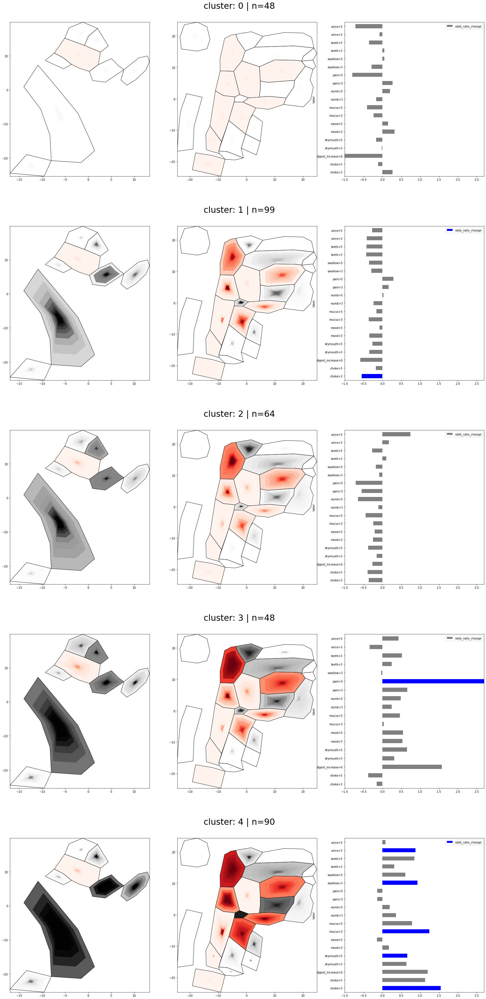

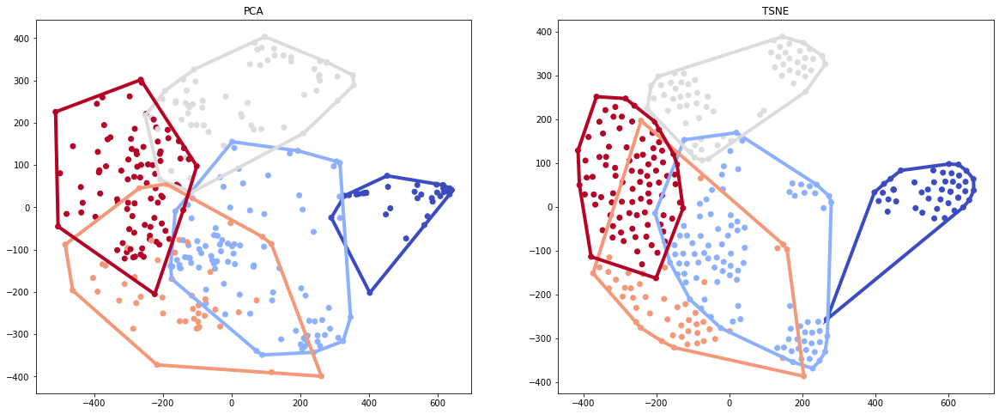

In [29]:
def center_scale_path(path,scale):
    bbox = path.get_extents()
    left = (1-scale)*(bbox.x0 + bbox.x1)/2
    up = (1-scale)*(bbox.y0 + bbox.y1)/2
    tform = mplt.Affine2D().scale(scale) + mplt.Affine2D().translate(left,up) 
    path2 = mplt.TransformedPath(path,tform)
    return path2.get_fully_transformed_path()

def format_dose_clusters(df,
                         keys = ['V25','V35','V45','V55'],
                         merge_leftright=True,
                         cname='dose_clusters',
                         olist =None):
    df = df.copy()
    clusters = sorted(df[cname].unique())
    n_clusters = len(clusters)
    if olist is None:
        olist = Const.organ_list[:]
    odict = {o: Const.organ_list.index(o) for o in olist}
    opositions = [odict.get(o) for o in olist]
    key_scales = [1*(.75**i) for i in range(len(keys))]
    formatted = []
    
    colormapdict = {
        'Brainstem': 'Purples',
        'IPC': 'Reds',
        'MPC': "Reds",
        'SPC': "Reds",
        "Supraglottic_Larynx": "Reds",
        "Cricopharyngeal_Muscle": "Reds",
        "Esophagus": "Reds",
        "Mylogeniohyoid_M": "Reds",
        "Tongue": "Reds",
        "Rt_Masseter_M": "Reds",
        'Lt_Masseter_M': "Reds",
    }
    
    def getcolor(val, organ,maxval):
        cmap = colormapdict.get(organ,'Greys')
        if cmap == 'Greys':
            val = val*.5
        val = max(.1,min(val/maxval,.99))
#         val=.9
        c = plt.get_cmap(cmap)
        return c(val)
    
    for cluster, subdf in df.groupby(cname):
        for key,scale in zip(keys,key_scales):
            vals = subdf[key].apply(lambda x: np.array([x[i] for i in opositions]))
            vals = np.stack(vals.values)
            means = np.nanmean(vals,axis=0)
            for organ,mean in zip(olist,means):
                color = getcolor(mean,organ)
                entry = {'organ':organ,'key':key,'mean':mean,'scale': scale,'cluster':cluster,'color':color}
                formatted.append(entry)
    data = pd.DataFrame(formatted)
    if merge_leftright:
        data = merge_leftright_dose_entries(data,getcolor)
    return data

def merge_leftright_dose_entries(df,getcolor=None):
    df = df.copy()
    if getcolor is None:
        getcolor = lambda x,o: 'Red'
    base_names = [o.replace('Lt_','') for o in df.organ.unique() if 'Lt_' in o]
    for (key,cluster,scale), subdf in df.groupby(['key','cluster','scale']):
        for oname in base_names:
            left = "Lt_" + oname
            right = 'Rt_' + oname
            subsubdf = subdf[subdf.organ.apply(lambda x: x in [left,right])]
            assert(subsubdf.shape[0] == 2)
            new_mean = subsubdf['mean'].mean()
            color = getcolor(new_mean,left)
            merged_entry = {
                'key': key,
                'cluster': cluster,
                'mean': new_mean,
                'scale':scale,
                'organ': oname,
                'color': color
            }
            df=df.append(merged_entry,ignore_index=True)
    return df

def format_dose_clusters2(df,
                         key = 'V55',
                        quantiles=[.1,.2,.3,.4,.5,.6,.7,.8,.9],
                         merge_leftright=True,
                         cname='dose_clusters',
                         olist =None):
    df = df.copy()
    clusters = sorted(df[cname].unique())
    n_clusters = len(clusters)
    if olist is None:
        olist = Const.organ_list[:]
    odict = {o: Const.organ_list.index(o) for o in olist}
    opositions = [odict.get(o) for o in olist]
    quant_scales = [1*(.75**i) for i in range(len(quantiles))]
    formatted = []
    
    colormapdict = {
        'IPC': 'Reds',
        'MPC': "Reds",
        'SPC': "Reds",
        "Supraglottic_Larynx": "Reds",
        "Cricopharyngeal_Muscle": "Reds",
        "Esophagus": "Reds",
        "Mylogeniohyoid_M": "Reds",
        "Tongue": "Reds",
        "Rt_Masseter_M": "Reds",
        'Lt_Masseter_M': "Reds",
    }
    
    def getcolor(val, organ,maxval=80):
        cmap = colormapdict.get(organ,'Greys')
        if cmap == 'Greys':
            val = val*.9
        val = max(.01,min(val/maxval,.99))
#         val=.9
        c = plt.get_cmap(cmap)
        return c(val)
    
    to_vals = lambda d: np.stack(d[key].apply(lambda x: np.array([x[i] for i in opositions])).values)
    allvals = to_vals(df)
    maxval = allvals.max()
    for cluster, subdf in df.groupby(cname):
        vals = to_vals(subdf)
#         vals = np.stack(vals.values)
        qs = np.quantile(vals,quantiles,axis=0)
        for qname, quants, scale in zip(quantiles,qs,quant_scales):
            for organ,val in zip(olist,quants):
                color = getcolor(val,organ,maxval)
                entry = {'organ':organ,'key':qname,'mean':val,'scale': scale,'cluster':cluster,'color':color}
                formatted.append(entry)
    data = pd.DataFrame(formatted)
    if merge_leftright:
        data = merge_leftright_dose_entries(data,getcolor)
    return data

def plot_dose_clusters(df,
                       key='V45',
                       keys=['V25','V35','V45','V55','V65'],
                       use_histograms=False,
                       svg_files=None,
                        outcomes=None,
                       outcome_thresholds = [3,5],
                        figscale=10,
                       cname='dose_clusters',
                       aggregate_sides = True,#just show mean sides instead of both
                      ):
    unformatted_df = df.copy()
    if outcomes is None:
        slist = ['pain','numb','drymouth','swallow','choke','voice','teeth','mucus','mood']
        s_suffix = '_late'
        ocols = [c for c in df.columns if 'symptom' in c and 'change' not in c]
        outcomes = [c for c in ocols if s_suffix in c and np.any([s in c for s in slist])]
        outcomes = ['digest_increase'] + outcomes
        
    odds_ratio_dfs = [cluster_oddsratio(df,outcomes=outcomes,cname=cname,threshold=t) for t in outcome_thresholds]
    odds_ratio_df = pd.concat(odds_ratio_dfs,ignore_index=True)
    if use_histograms:
        df = format_dose_clusters(df,keys=keys,cname=cname)
    else:
        df = format_dose_clusters2(df,key=key,cname=cname)

    if svg_files is None:
        svg_files = Const.organ_svg_files[:]
        #skip the right side if we aggreage
        if aggregate_sides:
            svg_files = svg_files[0:2]
    #failed attempt to pre-center svgs
    #makes them weird for some reason because of geometry or some shit
#     pathdicts = [get_centered_svgpaths(sf) for sf in svg_files]
    pathdicts = [P.load_organ_svg_file(sf) for sf in svg_files]
    #doing only center first
    clist = sorted(df['cluster'].unique())
    n_rows = len(df.cluster.unique())
    n_cols = len(pathdicts) + 1
    fig = plt.figure(figsize=[figscale*n_cols,figscale*n_rows])
    subfigures= fig.subfigures(nrows=n_rows)#,ncols=n_cols)
    axes = []
    for c,subfig in zip(clist,subfigures):
        subplots = subfig.subplots(1,n_cols)
        counts = unformatted_df[unformatted_df[cname] == c].shape[0]
        subfig.suptitle('cluster: ' + str(c) + ' | n=' + str(counts),fontsize=3*figscale )
        axes.append(subplots)
    def update_extents(extent,p):
        bbox = p.get_extents()
        extent[0][0] = min(bbox.x0,extent[0][0])
        extent[0][1] = min(bbox.y0,extent[0][1])
        extent[1][0] = max(bbox.x1,extent[1][0])
        extent[1][1] = max(bbox.y1,extent[1][1])
        return extent
    for ax_col, pathdict in enumerate(pathdicts):
        extents = np.array([[np.inf,np.inf],[0,0]])
#         axes = subfigures.subplots(1,n_cols)
        for organ,v in pathdict.items():
            if aggregate_sides:
                organ = organ.replace("Lt_",'').replace("Rt_",'')
            path = P.parse_path(v)
            i = 0
            for c in clist:
                clustdf = df[df.cluster == c]
                ax = axes[i][ax_col]
                i += 1
                subdf = clustdf[clustdf.organ == organ]
                subdf = subdf.sort_values('scale',ascending=False)
                for dummy,row in subdf.iterrows():
                    color = row.color
                    scale = row.scale
                    new_path = center_scale_path(path,scale)
                    extents = update_extents(extents,path)
                    patch = mpatches.PathPatch(
                        new_path,
#                         color=color,
                        fc=color,
                        ec='black' if scale >= .99 else color,
                        alpha=.99,
                    )
                    ax.add_patch(patch)
                ax.set_xlim((extents[0][0],extents[1][0]))
                ax.set_ylim((extents[0][1],extents[1][1]))
                
    odds_ratio_df['odds_ratio_change'] = (odds_ratio_df.odds_ratio - 1)
    makelabel = lambda x: x.replace('symptoms_','').replace('_late','').replace('_post','').replace('_max','')
    odds_ratio_df['label'] = odds_ratio_df.outcome.apply(makelabel) + odds_ratio_df.threshold.apply(lambda x: '>'+str(x))
    odds_max = odds_ratio_df.odds_ratio_change.max()
    odds_min = odds_ratio_df.odds_ratio_change.min()
    odds_ratio_df['color'] = odds_ratio_df.pval.apply(lambda x: 'blue' if x <= .05 else 'grey')
    odds_ratio_df=odds_ratio_df.drop_duplicates(subset=['label','odds_ratio_change'],keep='first')
    for i,c in enumerate(clist):
        ax = axes[i][-1]
        outcome_df = odds_ratio_df[odds_ratio_df[cname] == c].fillna(0)
        outcome_df = outcome_df.sort_values('label')
        outcome_df.plot(
            kind='barh',
            y='odds_ratio_change',
            x='label',
            color=outcome_df['color'].values.tolist(),
            ax=ax,
            xlim=(odds_min,odds_max)
        )
    return

def plot_cluster_embeddings(x,
                            clusters,
                            perplexity=30,
                            **kwargs
                           ):
    
    colors =plt.get_cmap('coolwarm')
    plot_colors = [colors(c/np.max(clusters)) for c in clusters]
    
    fsize = 10
    nplots = 2
    fig,ax = plt.subplots(1,nplots,figsize=[fsize*nplots,8])
    
    def encircle(p,ax):
        if len(p) < 3:
            return
        hull = ConvexHull(p,qhull_options='QbB')
        poly = plt.Polygon(p[hull.vertices,:],fc='none',ec=colors(l/np.max(clusters)),linewidth=4)
        ax.add_patch(poly)
    
    x_pca = PCA(2).fit_transform(x)
    ax[0].scatter(x_pca[:,0],x_pca[:,1],c=plot_colors)
    ax[0].set_title('PCA')
    
    sim_matrix = kwargs.get('sim_matrix')
    if sim_matrix is not None:
        tsne = TSNE(2,perplexity=perplexity,metric='precomputed')
        x_tsne = tsne.fit_transform(sim_matrix)
    else:
        if x.shape[0] < 10:
            x_pca_2 = PCA(10).fit_transform(x)
        else:
            x_pca_2 = x[:]
        x_tsne = TSNE(2,init='pca',learning_rate='auto',perplexity=perplexity).fit_transform(x_pca_2)
    ax[1].scatter(x_tsne[:,0],x_tsne[:,1],c=plot_colors)
    ax[1].set_title('TSNE')
    
    for l in np.unique(clusters):
        cluster_pca = x_pca[clusters==l]
        encircle(cluster_pca,ax[0])
        cluster_tsne = x_tsne[clusters==l]
        encircle(cluster_tsne,ax[1])
    return fig,ax

def cluster_and_plot_dose_clusters(df,
                                   key='V45',
                                   keys=['V25','V35','V45','V55','V65'],
                                   use_histograms=False,
                                   svg_files=None,
                                    outcomes=None,
                                    figscale=10,
                                   plot_keys=None,
                                   aggregate_sides = True,#just show mean sides instead of both
                                   **cluster_kwargs,
                        ):
    df = df.copy()
    cluster_kwargs['prefix'] = 'temp_'
    df = P.add_sd_dose_clusters(df,
                              **cluster_kwargs)
    cname = 'temp_dose_clusters'
    plot_dose_clusters(df,
                       key=key,
                       keys=keys,
                       cname=cname,
                       use_histograms=use_histograms,
                       svg_files=svg_files,
                       outcomes=outcomes,
                       figscale=figscale,
                       aggregate_sides=aggregate_sides,
                      )
    if plot_keys is None:
        plot_keys = cluster_kwargs.get('features',[key])
    xvals = np.stack(df.apply(lambda x: np.stack([np.array(x[k]) for k in plot_keys]).ravel(),axis=1).values)
    clusters = df[cname].values
    plot_cluster_embeddings(xvals,clusters)
    return 

cluster_and_plot_dose_clusters(sd_df,
                   key='V55',
                   features=['V35','V40','V45','V50','V55','V60','V65'],
                   organ_subset= Const.organ_list,
                   n_clusters=5,
                  )

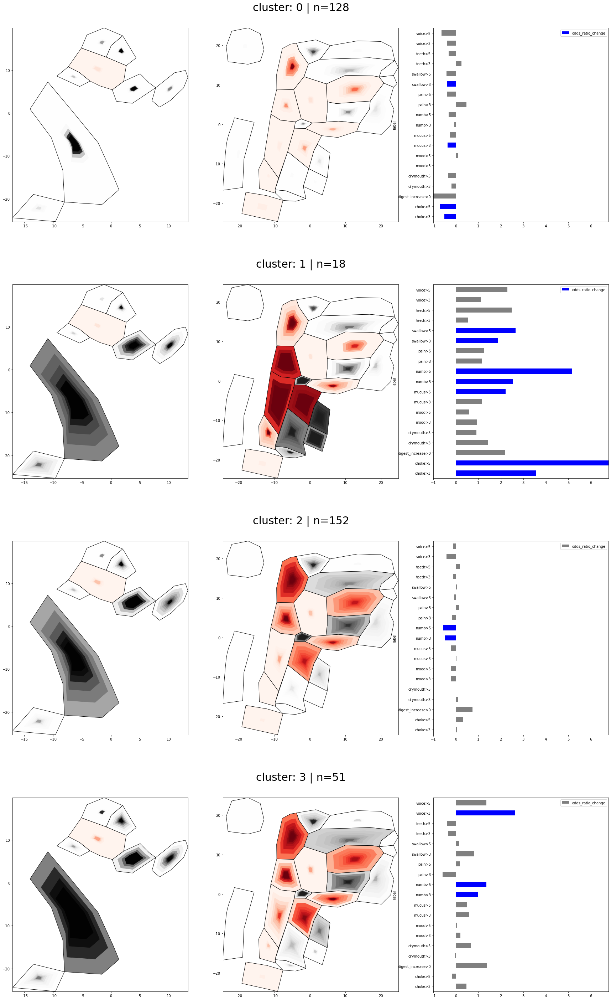

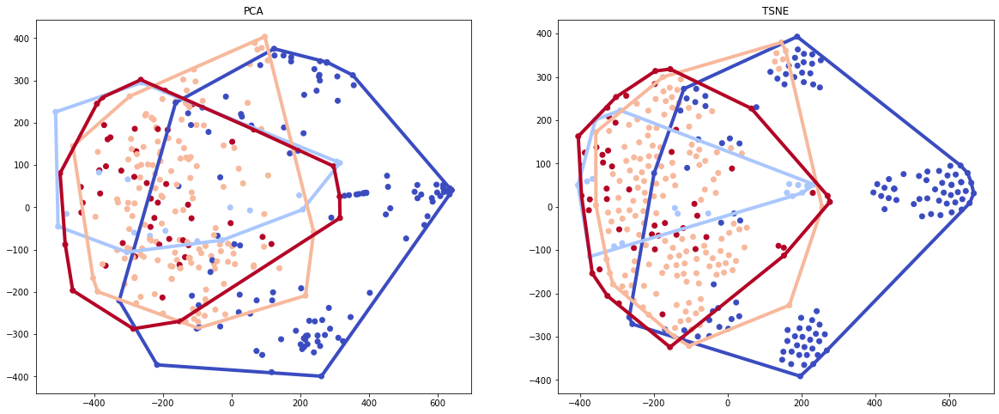

In [28]:
cluster_and_plot_dose_clusters(sd_df,
                   key='V55',
                   features=['V35','V40','V45','V50','V55','V60','V65'],
                   organ_subset= Const.symptom_organ_map['throat'],
                   n_clusters=4,
                  )

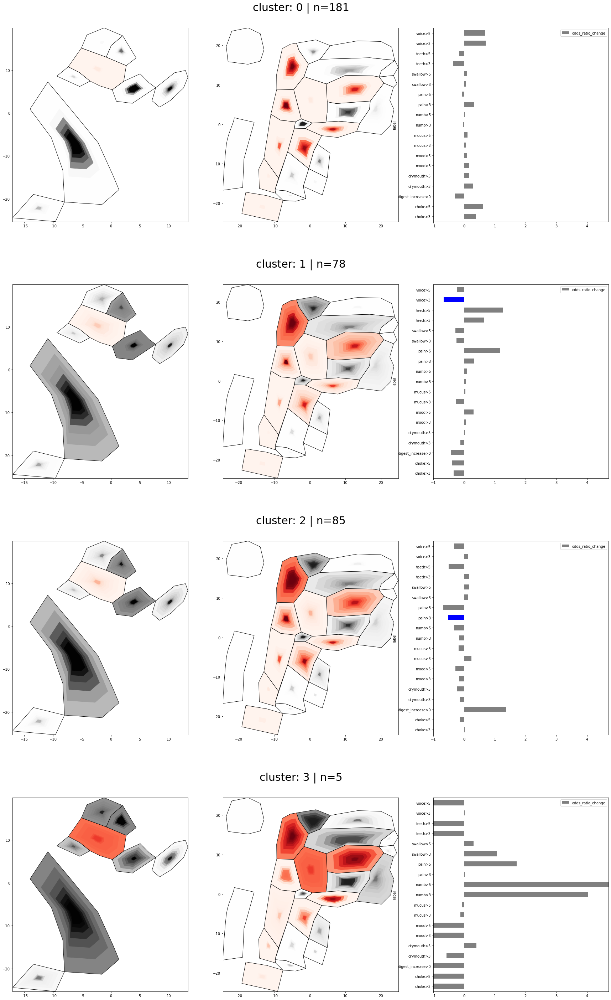

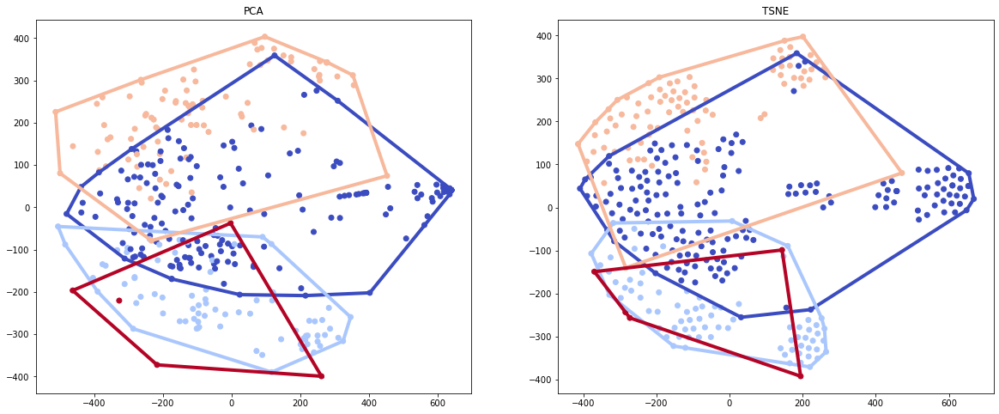

In [150]:
cluster_and_plot_dose_clusters(sd_df,
                   key='V55',
                   features=['V35','V40','V45','V50','V55','V60','V65'],
                   organ_subset= Const.symptom_organ_map['chew'],
                   n_clusters=4,
                  )

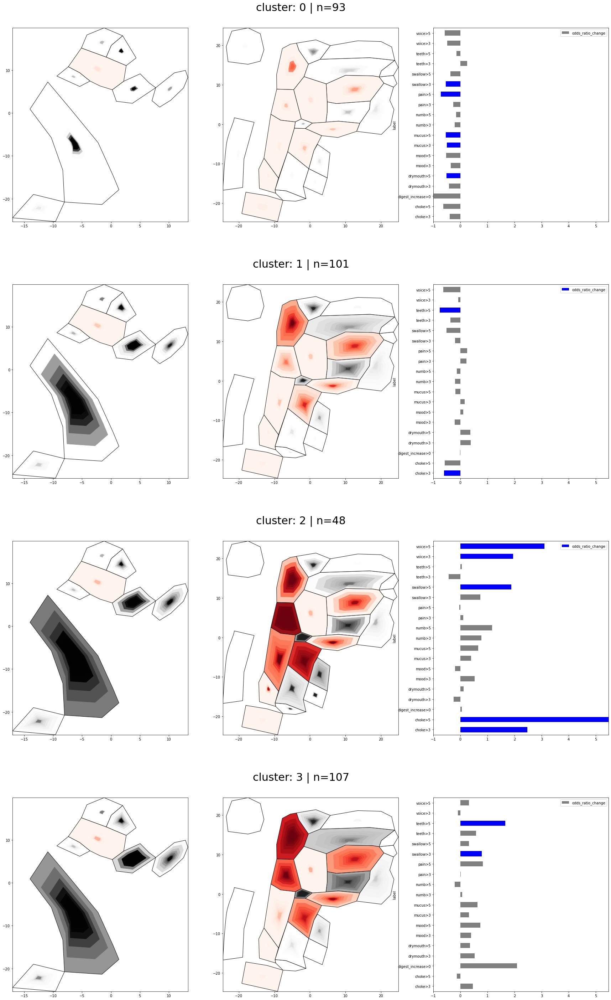

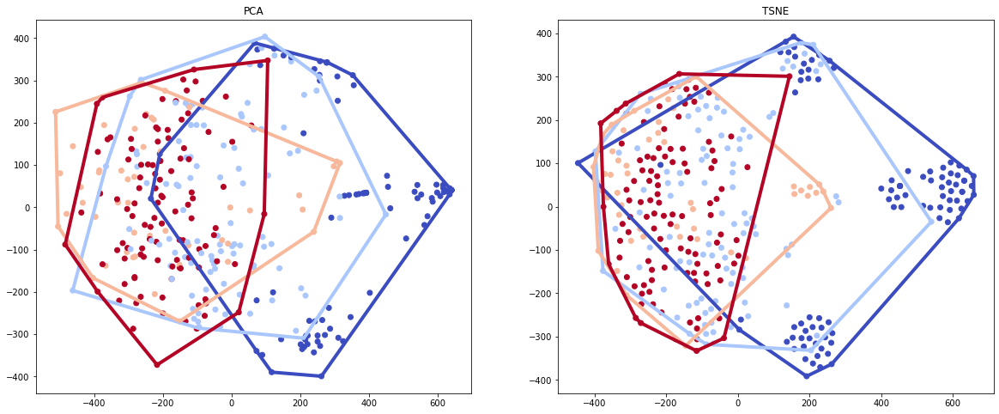

In [31]:
cluster_and_plot_dose_clusters(sd_df,
                   key='V55',
                   features=['V35','V40','V45','V50','V55','V60','V65'],
                   organ_subset= Const.symptom_organ_map['PCs'],
                   n_clusters=4,
                  )

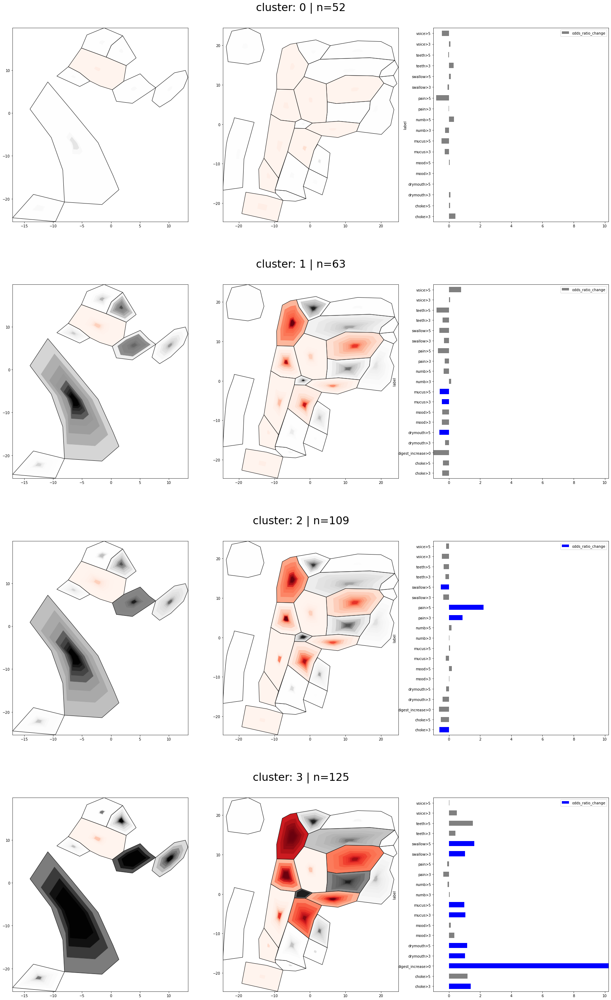

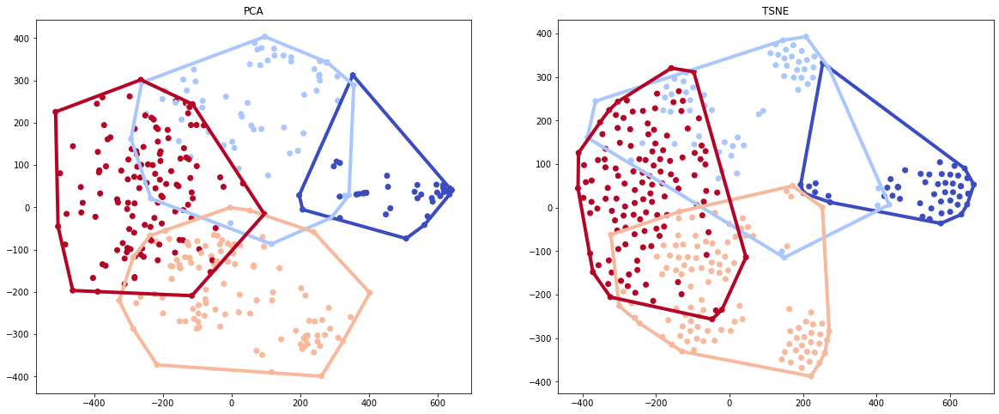

In [32]:
cluster_and_plot_dose_clusters(sd_df,
                   key='V55',
                   features=['V35','V40','V45','V50','V55','V60','V65'],
                   organ_subset= Const.symptom_organ_map['soft_mouth'],
                   n_clusters=4,
                  )

In [25]:
def get_clusters_and_outcomes(df, 
                              cluster_featuresets=None, 
                              symptoms=None,
                              n_clusters = 4,
                              simplify_outcomes = True,
                              plot_key='V55',
                              cluster_features=['V35','V40','V45','V50','V55','V60','V65'],
                              **cluster_kwargs):
    df = df.copy()
    if cluster_featuresets is None:
        cluster_featuresets = {k:v for k,v in Const.symptom_organ_map.items()}
        cluster_featuresets['baseline'] = Const.organ_list[:]
    clusters = []
    to_keep = ['symptom_clusters','digest_increase','t4']
    for c_prefix,c_features in cluster_featuresets.items():
        nclust = n_clusters
        if c_prefix == 'baseline':
            nclust = 5
        df = P.add_sd_dose_clusters(df,
                                  n_clusters=nclust,
                                  organ_subset=c_features,
                                  prefix=c_prefix+'_',
                                  features=cluster_features,
                                  **cluster_kwargs)
        to_keep.append(c_prefix+'_'+'dose_clusters')
    if symptoms is None:
        symptoms= Const.symptoms[:]
    def valid_symptom(c):
        if 'symptoms_' in c and 'max_post' in c or 'max_treatment' in c:
            return len(c) < 50
        return False
    symptom_indicators = [c for c in df.columns if valid_symptom(c)]
    dose_df = df[sorted(set(cluster_features + [plot_key]))]
    clust_df = df[to_keep + symptom_indicators]
    if simplify_outcomes:
        def simplify_symptom(val,sname):
            if val >= 5:
                return 2
            if val >= 3:
                return 1
            return 0
        for si in symptom_indicators:
            clust_df[si] = clust_df[si].apply(lambda x: simplify_symptom(x,si))
    binary_df = Utils.onehotify(clust_df)
    for c in binary_df.columns:
        if 'cluster' not in c and '_1' in c:
            severe = c.replace('_1','_2')
            if severe in binary_df.columns:
                binary_df[c] = (binary_df[c] + binary_df[severe] > 0).astype(int)
    df = pd.merge(binary_df,dose_df, on='id')
    return df
temp = get_clusters_and_outcomes(sd_df)
temp

,symptom_clusters_0,symptom_clusters_1,symptom_clusters_2,symptom_clusters_3,symptom_clusters_4,digest_increase_0,digest_increase_1,t4_0,t4_1,swallow_dose_clusters_0,...,symptoms_work_max_post_0,symptoms_work_max_post_1,symptoms_work_max_post_2,V35,V40,V45,V50,V55,V60,V65
id,,,,,,,,,,,,,,,,,,,,,
7,0,0,1,0,0,1,0,1,0,0,...,1,0,0,"[20.671875, 35.34375, 100.0, 100.0, 99.5625, 8...","[1.9306640625, 0.0, 100.0, 98.5, 71.6875, 56.2...","[0.0, 0.0, 99.75, 90.0, 33.625, 25.828125, 78....","[0.0, 0.0, 96.25, 72.0625, 7.28125, 12.9375, 5...","[0.0, 0.0, 75.6875, 50.90625, 0.280029296875, ...","[0.0, 0.0, 14.78125, 31.4375, 0.0, 0.0, 6.6875...","[0.0, 0.0, 0.0, 12.2734375, 0.0, 0.0, 0.835937..."
8,0,0,1,0,0,1,0,1,0,0,...,0,1,0,"[0.0, 0.67431640625, 96.9375, 100.0, 0.7021484...","[0.0, 0.0, 94.625, 99.5, 0.0, 1.25, 98.1875, 1...","[0.0, 0.0, 74.9375, 96.4375, 0.0, 0.0, 81.8125...","[0.0, 0.0, 32.4375, 88.75, 0.0, 0.0, 63.125, 1...","[0.0, 0.0, 18.453125, 74.5, 0.0, 0.0, 40.09375...","[0.0, 0.0, 0.0, 25.578125, 0.0, 0.0, 12.851562...","[0.0, 0.0, 0.0, 10.78125, 0.0, 0.0, 0.0, 37.40..."
9,0,1,0,0,0,1,0,1,0,1,...,1,0,0,"[45.40625, 0.0, 45.40625, 45.40625, 0.0, 20.0,...","[32.96875, 0.0, 32.96875, 32.96875, 0.0, 16.75...","[22.078125, 0.0, 22.078125, 22.078125, 0.0, 11...","[12.4921875, 0.0, 12.4921875, 12.4921875, 0.0,...","[4.3359375, 0.0, 4.3359375, 4.3359375, 0.0, 0....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.383056640625,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 11.1953125..."
10,0,0,0,0,1,1,0,0,1,0,...,1,0,0,"[41.5, 12.203125, 58.46875, 72.875, 100.0, 98....","[26.921875, 1.3623046875, 55.78125, 63.1875, 9...","[7.03125, 0.095947265625, 53.9375, 50.40625, 4...","[0.47705078125, 0.0, 51.96875, 30.109375, 16.8...","[0.0, 0.0, 45.09375, 12.7265625, 5.51171875, 1...","[0.0, 0.0, 19.421875, 0.0, 0.157470703125, 0.6...","[0.0, 0.0, 9.078125, 0.0, 0.0, 0.0, 47.46875, ..."
11,0,1,0,0,0,1,0,1,0,0,...,1,0,0,"[0.0, 0.026763916015625, 99.5625, 100.0, 3.064...","[0.0, 0.0, 94.9375, 99.125, 0.0, 7.96484375, 1...","[0.0, 0.0, 20.046875, 97.875, 0.0, 1.225585937...","[0.0, 0.0, 0.0, 90.625, 0.0, 0.0, 76.8125, 100...","[0.0, 0.0, 0.0, 52.5625, 0.0, 0.0, 21.1875, 93...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.662109375, 43...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.4609375,..."
13,0,0,0,1,0,1,0,1,0,0,...,1,0,0,"[69.5, 0.0, 86.875, 99.25, 2.68359375, 24.8281...","[38.78125, 0.0, 82.9375, 98.25, 0.067077636718...","[0.0, 0.0, 67.625, 80.375, 0.0, 5.65234375, 37...","[0.0, 0.0, 38.03125, 7.56640625, 0.0, 2.695312...","[0.0, 0.0, 23.984375, 1.0888671875, 0.0, 0.095...","[0.0, 0.0, 10.921875, 0.0, 0.0, 0.0, 9.390625,...","[0.0, 0.0, 5.30859375, 0.0, 0.0, 0.0, 3.017578..."
15,0,0,0,0,1,1,0,1,0,0,...,0,1,0,"[70.25, 1.779296875, 78.125, 99.8125, 22.42187...","[36.0, 0.0, 77.8125, 99.3125, 16.140625, 28.93...","[9.6015625, 0.0, 67.1875, 96.5625, 7.625, 22.5...","[0.0, 0.0, 0.0, 53.8125, 0.0, 9.5859375, 0.0, ...","[0.0, 0.0, 0.0, 31.09375, 0.0, 0.0, 0.0, 57.84...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 35.625, 0....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 26.8125, 0..."
16,0,0,0,0,1,1,0,1,0,0,...,1,0,0,"[0.0, 1.755859375, 95.375, 100.0, 13.8984375, ...","[0.0, 0.0, 87.5625, 99.8125, 8.7265625, 22.734...","[0.0, 0.0, 66.9375, 89.875, 4.6328125, 19.0312...","[0.0, 0.0, 31.953125, 56.0625, 1.185546875, 14...","[0.0, 0.0, 0.0, 23.5625, 0.0, 7.76171875, 0.18...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.61767578125, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0078125,..."
18,0,0,1,0,0,1,0,1,0,0,...,1,0,0,"[45.40625, 0.0, 45.40625, 45.40625, 1.4375, 28...","[32.96875, 0.0, 32.96875, 32.96875, 0.0, 20.90...","[22.078125, 0.0, 22.078125, 22.078125, 0.0, 12...","[12.4921875, 0.0, 12.4921875, 12.4921875, 0.0,...","[4.3359375, 0.0, 4.3359375, 4.3359375, 0.0, 1....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.28125, 60.468...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.380126953125,..."


In [34]:
def export_df_subset(df,
                     cluster_features=['V35','V40','V45','V50','V55','V60','V65'],
                     cluster_featuresets = None,
                    ):
    #for testing with observable
    to_keep = [c for c in df.columns if re.match('V[2-8][0-9]?',c) is not None]
    to_keep = to_keep + ['volume','mean_dose']
    to_keep = to_keep + [c for c in df.columns if 'symptoms_' in c and 'original' not in c]
    
    if cluster_featuresets is None:
        cluster_featuresets = {k:v for k,v in Const.symptom_organ_map.items()}
        cluster_featuresets['baseline'] = Const.organ_list[:]
        
    for c_prefix,c_features in cluster_featuresets.items():
        nclust = 4
        if c_prefix == 'baseline':
            nclust = 5
        df = P.add_sd_dose_clusters(df,
                                  n_clusters=nclust,
                                  organ_subset=c_features,
                                  prefix=c_prefix+'_',
                                  features=cluster_features
                                 )
        to_keep.append(c_prefix+'_'+'dose_clusters')
    return df[to_keep]
export_df_subset(sd_df).to_csv(Const.data_dir+'dose_cluster_03032022.csv')

In [39]:
sd_df.symptoms_drymouth_max_late

id
7       8.0
8       5.0
9       3.0
10      2.0
11      2.0
13      3.0
15      8.0
16      2.0
18      3.0
22     10.0
23      7.0
25      9.0
28      2.0
29      6.0
31      0.0
34      3.0
37      4.0
38      2.0
39      5.0
42      0.0
43      5.0
44      2.0
45      7.0
46     10.0
47      2.0
48      9.0
49      3.0
50      2.0
51      4.0
53      9.0
54      0.0
56      9.0
57      6.0
58      5.0
60      3.0
61      7.0
62      5.0
65      2.0
69      6.0
72      4.0
73      2.0
77      3.0
78      2.0
79      2.0
80      8.0
82      4.0
85      2.0
86      8.0
91      2.0
92      4.0
93      5.0
94      7.0
95      0.0
96      2.0
97      4.0
98      2.0
99      8.0
101     4.0
102     9.0
104     9.0
105     3.0
107     2.0
109     5.0
110     6.0
111     2.0
112     7.0
116     4.0
117     3.0
120     9.0
121     8.0
123     4.0
127     5.0
133     2.0
135     2.0
136     7.0
137     1.0
138     3.0
139     4.0
140     0.0
141     2.0
143     2.0
145     6.0
147     1.0
1

In [74]:
from RPorts import r_fisher_exact
temp  = P.add_sd_dose_clusters(sd_df,
                               n_clusters=4,
                               organ_subset=Const.symptom_organ_map['soft_mouth'],
                               prefix='soft_throat_',
#                                features=['V25','V35','V45','V55','V65','V75'],
                               features=['V35','V40','V45','V50','V55','V60','V65','V75'],
                              )
Metrics.vector_chi2(temp.soft_throat_dose_clusters.values,sd_df.symptoms_drymouth_max_post.values  >5)

(13.803139685653068, 0.003185736065116939)

In [27]:
def sddf_to_json(df,
                 to_drop =None,
                ):
    if to_drop is None:
        to_drop = ['min_dose','is_ajcc_8th_edition']
    df = df.copy().fillna(0)
    is_dose_dvh = lambda x: re.match('D[0-9][0-9]?',x) is not None
    vol_dvh_too_high = lambda x: re.match('V[0-18-9][0-9]?',x) is not None
    for c in df.columns:
        if is_dose_dvh(c) or vol_dvh_too_high(c):
            to_drop.append(c)
        if 'symptoms' in c and 'original' in c:
            to_drop.append(c)
        if '_max_' in c:
            to_drop.append(c)
    df = df.drop(to_drop,axis=1)
    ddict = df.to_dict(orient='index')
    return ddict
sd_dict = sddf_to_json(sd_df)
sd_dict

{7: {'V20': [61.5,
   100.0,
   100.0,
   100.0,
   100.0,
   100.0,
   100.0,
   100.0,
   67.625,
   100.0,
   100.0,
   100.0,
   100.0,
   54.46875,
   100.0,
   89.0,
   58.25,
   99.875,
   95.3125,
   33.25,
   100.0,
   100.0,
   73.625,
   64.1875,
   100.0,
   100.0,
   100.0,
   100.0,
   100.0,
   100.0,
   100.0,
   100.0,
   100.0,
   100.0,
   99.3125,
   88.6875,
   82.3125,
   93.8125,
   33.125,
   100.0],
  'V25': [58.03125,
   98.5,
   100.0,
   100.0,
   100.0,
   100.0,
   100.0,
   100.0,
   53.90625,
   100.0,
   100.0,
   100.0,
   100.0,
   50.65625,
   100.0,
   75.4375,
   48.59375,
   99.5,
   74.1875,
   27.5,
   100.0,
   100.0,
   61.5,
   54.5625,
   100.0,
   100.0,
   100.0,
   100.0,
   100.0,
   100.0,
   100.0,
   100.0,
   100.0,
   100.0,
   96.25,
   84.4375,
   60.25,
   72.875,
   6.78125,
   100.0],
  'V30': [49.0625,
   90.6875,
   100.0,
   100.0,
   100.0,
   99.75,
   100.0,
   100.0,
   35.25,
   90.9375,
   88.75,
   100.0,
   100.0,
  

In [72]:
sd_df.t4

id
7      0
8      0
9      0
10     1
11     0
13     0
15     0
16     0
18     0
22     1
23     0
25     0
28     0
29     0
31     0
34     0
37     0
38     0
39     0
42     0
43     1
44     0
45     0
46     0
47     0
48     1
49     0
50     0
51     0
53     0
54     0
56     0
57     0
58     0
60     0
61     0
62     0
65     0
69     0
72     1
73     0
77     0
78     0
79     1
80     0
82     1
85     0
86     0
91     1
92     0
93     1
94     0
95     0
96     1
97     0
98     0
99     0
101    0
102    1
104    0
105    0
107    0
109    0
110    0
111    0
112    1
116    0
117    0
120    0
121    1
123    0
127    0
133    0
135    0
136    0
137    0
138    0
139    0
140    0
141    0
143    0
145    0
147    0
149    0
150    0
152    0
153    0
156    1
157    0
158    0
160    0
161    0
163    0
164    0
165    0
166    0
167    0
168    0
171    1
176    0
177    0
180    0
184    0
185    0
186    0
188    0
189    1
190    0
193    0
194    0
198    